**Meta-Data** of the Dataset:

1.Density determined from underwater weighing

2.Percent body fat from Siri's (1956) equation - **Target Variable**

3.Age (years)

4.Weight (lbs)

5.Height (inches)

6.Neck circumference (cm)

7.Chest circumference (cm)

8.Abdomen 2 circumference (cm)

9.Hip circumference (cm)

10.Thigh circumference (cm)

11.Knee circumference (cm)

12.Ankle circumference (cm)

13.Biceps (extended) circumference (cm)

14.Forearm circumference (cm)

15.Wrist circumference (cm)

## Setting Up

To set up, we import the following libraries:
- NumPy: for data manipulation
- Pandas: for data manipulation
- MatPlotLib: for data visualization
- Seaborn: for data visualization
- TensorFlow: for building neural networks

In [1]:
# importing the libraries
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import tensorflow as tf

Next, we read the dataset from the csv. To do this, we use the read_csv() function from the Pandas library.

In [2]:
# reading the dataset
df = pd.read_csv('bodyfat.csv')

After that, we view the first few rows of the dataset using the head() function from the Pandas library.

In [3]:
# viewing the first 5 rows of the dataset
df.head()

,Density,BodyFat,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist
0,1.0708,12.3,23,154.25,67.75,36.2,93.1,85.2,94.5,59.0,37.3,21.9,32.0,27.4,17.1
1,1.0853,6.1,22,173.25,72.25,38.5,93.6,83.0,98.7,58.7,37.3,23.4,30.5,28.9,18.2
2,1.0414,25.3,22,154.00,66.25,34.0,95.8,87.9,99.2,59.6,38.9,24.0,28.8,25.2,16.6
3,1.0751,10.4,26,184.75,72.25,37.4,101.8,86.4,101.2,60.1,37.3,22.8,32.4,29.4,18.2
4,1.0340,28.7,24,184.25,71.25,34.4,97.3,100.0,101.9,63.2,42.2,24.0,32.2,27.7,17.7


We also check for the dimensions of the dataset using the shape attribute of a dataframe in the Pandas library.

In [4]:
# checking for dimensions of the dataset
df.shape

(252, 15)

As we can see, there are 252 rows and 15 columns in the dataset.

## Preprocessing the Dataset



To begin, we first check for missing values using the isnull() and sum() functions from the Pandas library.

In [5]:
# checking for missing values
df.isnull().sum()

Density    0
BodyFat    0
Age        0
Weight     0
Height     0
Neck       0
Chest      0
Abdomen    0
Hip        0
Thigh      0
Knee       0
Ankle      0
Biceps     0
Forearm    0
Wrist      0
dtype: int64

As we can see, there are no missing values.

Next, we check to encode categorical features using the dtype attribute of the dataset.

In [6]:
# checking the data types of the columns in the dataset
df.dtypes

Density    float64
BodyFat    float64
Age          int64
Weight     float64
Height     float64
Neck       float64
Chest      float64
Abdomen    float64
Hip        float64
Thigh      float64
Knee       float64
Ankle      float64
Biceps     float64
Forearm    float64
Wrist      float64
dtype: object

As we can see, all the columns are numerical in nature. Hence, there is no need for encoding.

After that, we segregate the dependent (y) variable and the independent (x) variables using the drop() function from the Pandas library.

In [7]:
# segregating the dependent (y) and independent (y) features
x = df.drop(columns=['BodyFat'])
y = df['BodyFat']

Next, we use scale the dependent features such that their values are between 0 and 1. This makes neural networks more efficient by speeding up the training process, and also yeilds higher accuracy. For that we use the MinMaxScaler() from the SkLearn library.

In [8]:
# scaling the dependent variables to be between 0 and 1
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
x = scaler.fit_transform(x)

After that, we split the dataset into training and testing sets. As per the given instructions, we allot 85% (70 training + 15 validation) to the training dataset and 15% to the testing dataset. To do this, we use the train_test_split() function from the SkLearn library.

In [9]:
# splitting the dataset into training and testing sets
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.85, random_state=101)

## Building Neural Networks

We begin building models with combinations of the following specifications:

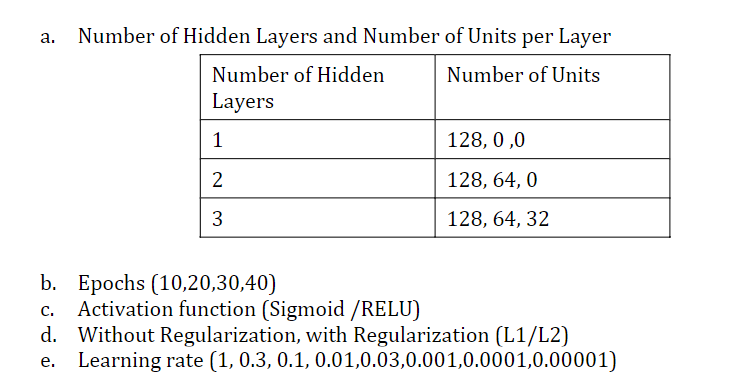

Firstly, we initialize two lists: learning_rates and epochs to store the various values of the learning rates and epochs to iterate over. Next, we declare a variable names history to store the specification and results of various networks built. We also import the function mean_squared_error() from the SKLearn library for further use and evaluation.

In [10]:
# initializing values of learning rates and epochs
learning_rates = [1, 0.3, 0.1, 0.01, 0.03, 0.001, 0.0001, 0.00001]
epochs = [10, 20, 30, 40]

# declaring variable to store specifications of models
history = []

# importing mean_squared_error for further use
from sklearn.metrics import mean_squared_error

General methodology followed:

**Building the Neural Network**

- We build different models for various combinations of number of hidden layers, activation function, and regularization (static specifications).
- We iterate over the learning rates and epochs (iterable specifications) and train neural networks with the above mentioned static specifications and iterable specifications.
- In each network, we set the activation of the output layer having one neuron to be 'linear' because it is a regression task, optimizer to be Adam with iterable learning rate, loss to be Mean Squared Error and metrics to be Root Mean Squared Error during compilation.
- During fitting the data, we set the batch size to be 10, and validation split to be 0.1275 (15% of 85% of the training data) in each network.
- We then calculate the rmse of the network on the testing dataset using the previously imported mean_squared_error() function and the sqrt() function from the NumPy library.
- We store the model specifications and results - test rmse, train rmse history, validation rmse history, train loss history, and validation loss history in a dictionary and append it to the previously created history list.



**Visualizing the Loss**
- We iterate over all the model specifications (static and iterable), and obtain the training loss history and validation loss history of the network with the required static specifications for each combination of the iterable specifications.
- We form a 4x8 plot to plot the obtained loss history on the y-axis with the number of epochs on the x-axis for all the 4 number of epochs and 8 learning rates using functions from the MatPlotLib library.

### Network-1: 

Static Specifications:

- Number of Hidden Layers: 1
- Activation Function: Sigmoid
- Regularization: None


In [11]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='sigmoid'))
model.add(tf.keras.layers.Dense(1, activation='linear'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 1,
         'Activation Function' : 'sigmoid',
         'Regularization' : 'None',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 3s 11ms/step - loss: 663.0749 - root_mean_squared_error: 25.7502 - val_loss: 63.1566 - val_root_mean_squared_error: 7.9471
Epoch 2/10
19/19 [==============================] - 0s 3ms/step - loss: 126.9624 - root_mean_squared_error: 11.2678 - val_loss: 126.7696 - val_root_mean_squared_error: 11.2592
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 80.1605 - root_mean_squared_error: 8.9532 - val_loss: 56.7794 - val_root_mean_squared_error: 7.5352
Epoch 4/10
19/19 [==============================] - 0s 5ms/step - loss: 69.3197 - root_mean_squared_error: 8.3258 - val_loss: 51.1949 - val_root_mean_squared_error: 7.1551
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 46.0253 - root_mean_squared_error: 6.7842 - val_loss: 55.8306 - val_root_mean_squared_error: 7.4720
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 45.1154 - root_mean_squared_error: 6.7168 - val_loss: 86.9734

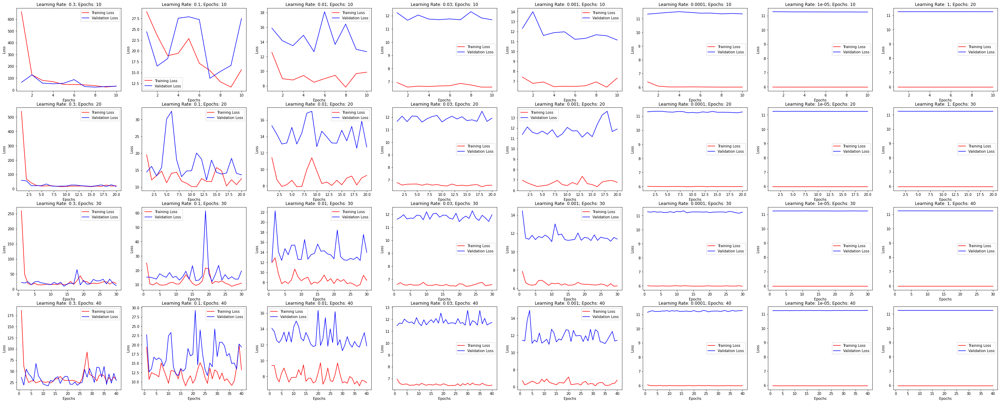

In [12]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==1) & (history[j]['Activation Function']=='sigmoid') & (history[j]['Regularization']=='None') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, there is an initial drop in the losses for all values of epochs, with very less difference between the train and validation loss. For 40 epochs, there is some fluctuation.
- For Learning Rate=0.1 and 0.01, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is a slight decreasing trend and noticable fluctuation for all values of epochs.
- For Learning Rate=0.03 and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, 0.00001, and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, the fluctuations increase with increase in number of epochs keeping learning rate constant.

### Network-2: 

Static Specifications:

- Number of Hidden Layers: 1
- Activation Function: Sigmoid
- Regularization: L1

In [13]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='sigmoid', kernel_regularizer='l1'))
model.add(tf.keras.layers.Dense(1, activation='linear', kernel_regularizer='l1'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 1,
         'Activation Function' : 'sigmoid',
         'Regularization' : 'L1',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 11ms/step - loss: 657.0056 - root_mean_squared_error: 24.6145 - val_loss: 210.7593 - val_root_mean_squared_error: 12.1491
Epoch 2/10
19/19 [==============================] - 0s 5ms/step - loss: 230.9393 - root_mean_squared_error: 13.2990 - val_loss: 114.5068 - val_root_mean_squared_error: 8.3824
Epoch 3/10
19/19 [==============================] - 0s 5ms/step - loss: 139.1311 - root_mean_squared_error: 10.0764 - val_loss: 102.3529 - val_root_mean_squared_error: 8.4497
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 78.5006 - root_mean_squared_error: 7.0364 - val_loss: 95.0840 - val_root_mean_squared_error: 8.2784
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 63.1746 - root_mean_squared_error: 6.2048 - val_loss: 62.8879 - val_root_mean_squared_error: 6.4022
Epoch 6/10
19/19 [==============================] - 0s 5ms/step - loss: 47.1160 - root_mean_squared_error: 5.2510 - val_loss: 67.

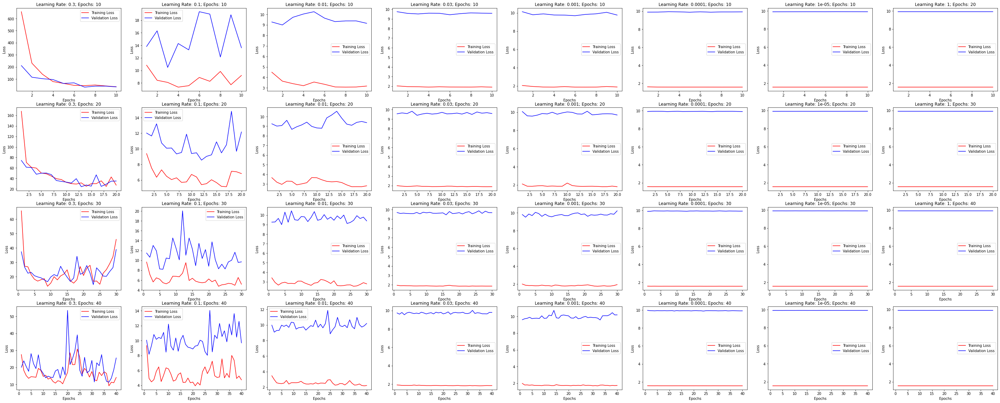

In [14]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==1) & (history[j]['Activation Function']=='sigmoid') & (history[j]['Regularization']=='L1') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, the general trend of the loss is decreasing in nature, with very less difference between training and validation loss if we train for 10, 20, and 30 epochs. However, if we train for 40 epochs, the loss fluctuates without any significant trend.
- For Learning Rate=0.1 and 0.01, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and noticable fluctuation for all values of epochs.
- For Learning Rate=0.03 and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, 0.00001, and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, the fluctuations increase with increase in number of epochs keeping learning rate constant.

### Network-3: 

Static Specifications:

- Number of Hidden Layers: 1
- Activation Function: Sigmoid
- Regularization: L2

In [15]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='sigmoid', kernel_regularizer='l2'))
model.add(tf.keras.layers.Dense(1, activation='linear', kernel_regularizer='l2'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 1,
         'Activation Function' : 'sigmoid',
         'Regularization' : 'L2',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 11ms/step - loss: 481.5677 - root_mean_squared_error: 19.9426 - val_loss: 112.5559 - val_root_mean_squared_error: 6.9058
Epoch 2/10
19/19 [==============================] - 0s 4ms/step - loss: 175.2196 - root_mean_squared_error: 10.4179 - val_loss: 148.8445 - val_root_mean_squared_error: 7.6563
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 141.3595 - root_mean_squared_error: 6.4934 - val_loss: 129.0170 - val_root_mean_squared_error: 6.1402
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 102.5621 - root_mean_squared_error: 5.6907 - val_loss: 60.6451 - val_root_mean_squared_error: 3.6405
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 57.7232 - root_mean_squared_error: 4.8154 - val_loss: 39.9326 - val_root_mean_squared_error: 3.8316
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 39.0676 - root_mean_squared_error: 4.3261 - val_loss: 55.3

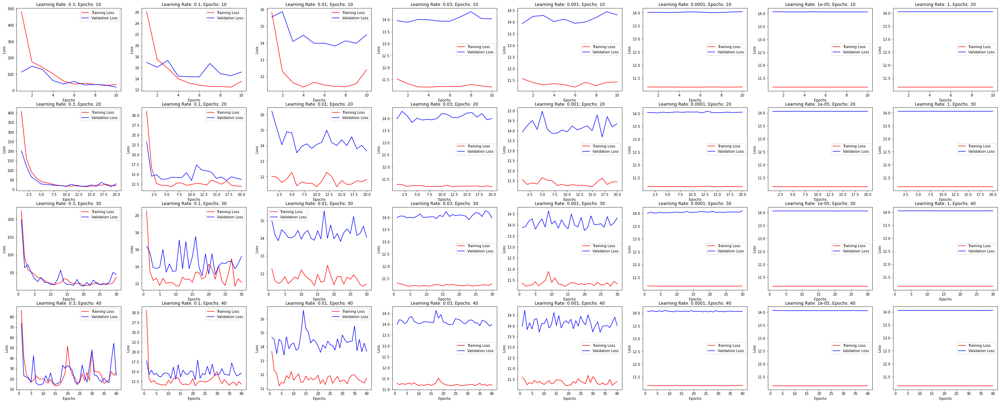

In [16]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==1) & (history[j]['Activation Function']=='sigmoid') & (history[j]['Regularization']=='L2') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3 and 0.1, the general trend of the loss is decreasing in nature, with very less difference between training and validation loss if we train for 10, 20, or 30 epochs. However, if we train for 40 epochs, there is an intial drop in loss, after which there is no significant trend but high fluctuations.
- For Learning Rate=0.01, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is a decreasing trend and noticable fluctuation for all values of epochs.
- For Learning Rate=0.03 and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, 0.00001, and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, fluctuations increase with increase in number of epochs keeping learning rate constant.

As we can see, the loss becomes constant faster with regularization than without regularization.

### Network-4: 

Static Specifications:

- Number of Hidden Layers: 1
- Activation Function: ReLU
- Regularization: None

In [17]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='relu'))
model.add(tf.keras.layers.Dense(1, activation='linear'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 1,
         'Activation Function' : 'relu',
         'Regularization' : 'None',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 9ms/step - loss: 3762.1128 - root_mean_squared_error: 61.3361 - val_loss: 46.3896 - val_root_mean_squared_error: 6.8110
Epoch 2/10
19/19 [==============================] - 0s 6ms/step - loss: 36.9517 - root_mean_squared_error: 6.0788 - val_loss: 34.1530 - val_root_mean_squared_error: 5.8441
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 29.0223 - root_mean_squared_error: 5.3872 - val_loss: 21.4664 - val_root_mean_squared_error: 4.6332
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 22.1179 - root_mean_squared_error: 4.7030 - val_loss: 12.4502 - val_root_mean_squared_error: 3.5285
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 14.1947 - root_mean_squared_error: 3.7676 - val_loss: 8.8448 - val_root_mean_squared_error: 2.9740
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 10.8341 - root_mean_squared_error: 3.2915 - val_loss: 6.7561 - val

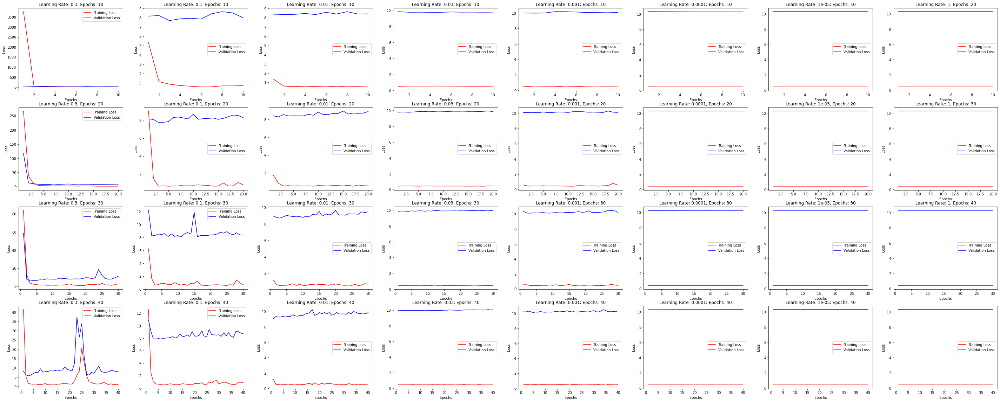

In [18]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==1) & (history[j]['Activation Function']=='relu') & (history[j]['Regularization']=='None') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, there is an initial drop in the losses for all values of epochs, with very less difference between the train and validation loss. For 40 epochs, there is some fluctuation.
- For Learning Rate=0.1 and 0.01, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is an initial drop in loss after which there is no significant terend for all values of epochs.
- For Learning Rate=0.03,  0.001, 0.0001, 0.00001, and 1 there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.

In general, fluctuations increase with number of epochs keeping learning rate constant.

### Network-5: 

Static Specifications:

- Number of Hidden Layers: 1
- Activation Function: ReLU
- Regularization: L1

In [19]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='relu', kernel_regularizer='l1'))
model.add(tf.keras.layers.Dense(1, activation='linear', kernel_regularizer='l1'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 1,
         'Activation Function' : 'relu',
         'Regularization' : 'L1',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 11ms/step - loss: 6890.2412 - root_mean_squared_error: 82.7462 - val_loss: 319.3855 - val_root_mean_squared_error: 15.9065
Epoch 2/10
19/19 [==============================] - 0s 4ms/step - loss: 158.4817 - root_mean_squared_error: 9.4653 - val_loss: 110.9484 - val_root_mean_squared_error: 6.5264
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 99.5138 - root_mean_squared_error: 5.8323 - val_loss: 90.5304 - val_root_mean_squared_error: 5.3510
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 87.5417 - root_mean_squared_error: 5.3364 - val_loss: 78.2248 - val_root_mean_squared_error: 4.6975
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 79.4770 - root_mean_squared_error: 5.0354 - val_loss: 92.8442 - val_root_mean_squared_error: 6.3795
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 73.9485 - root_mean_squared_error: 4.8014 - val_loss: 66.250

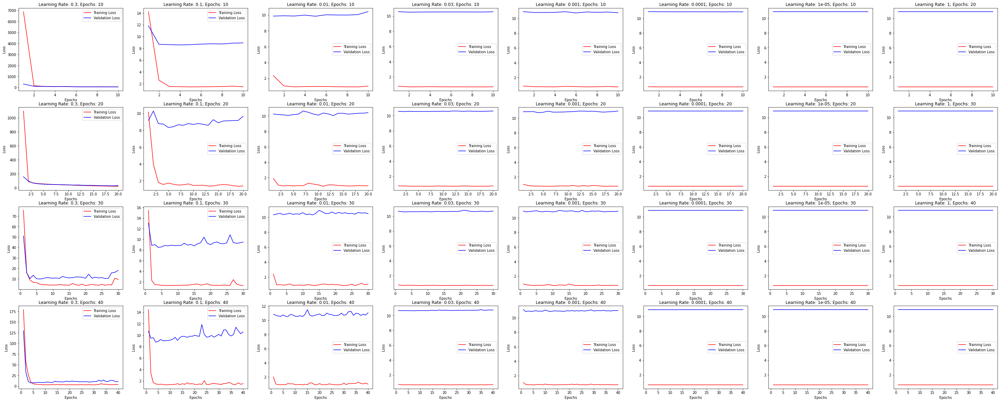

In [20]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==1) & (history[j]['Activation Function']=='relu') & (history[j]['Regularization']=='L1') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, there is an initial drop in the loss, with very less difference between training and validation loss for all values of epochs.
- For Learning Rate=0.1 and 0.01, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is an initial drop in loss followed by no significant trend and noticable fluctuation for all values of epochs.
- For Learning Rate=0.03, 0.001, 0.0001, 0.00001, and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.

In general, fluctuations increase with number of epochs keeping learning rate constant.

### Network-6: 

Static Specifications:

- Number of Hidden Layers: 1
- Activation Function: ReLU
- Regularization: L2

In [21]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='relu', kernel_regularizer='l2'))
model.add(tf.keras.layers.Dense(1, activation='linear', kernel_regularizer='l2'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 1,
         'Activation Function' : 'relu',
         'Regularization' : 'L2',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 10ms/step - loss: 10824.2939 - root_mean_squared_error: 103.4807 - val_loss: 614.3066 - val_root_mean_squared_error: 20.0159
Epoch 2/10
19/19 [==============================] - 0s 4ms/step - loss: 501.4558 - root_mean_squared_error: 16.5688 - val_loss: 525.0981 - val_root_mean_squared_error: 17.1818
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 422.5711 - root_mean_squared_error: 13.8904 - val_loss: 451.9675 - val_root_mean_squared_error: 14.9597
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 365.6722 - root_mean_squared_error: 11.8115 - val_loss: 384.2628 - val_root_mean_squared_error: 12.6899
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 321.8417 - root_mean_squared_error: 10.0956 - val_loss: 332.1186 - val_root_mean_squared_error: 10.7812
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 293.2043 - root_mean_squared_error: 8.9978 -

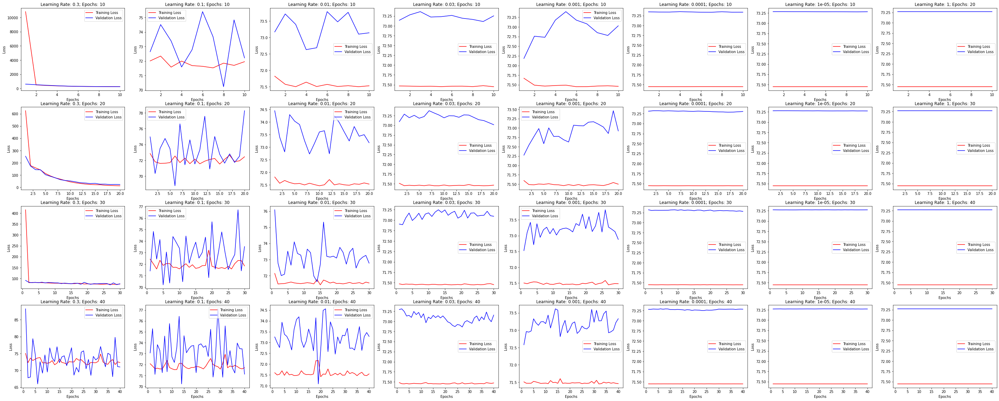

In [22]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==1) & (history[j]['Activation Function']=='relu') & (history[j]['Regularization']=='L2') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, the general trend of the loss is decreasing in nature, with very less difference between training and validation loss (except in the initial stage) with negligible fluctuations, if we train for 10, 20, or 30 epochs. If we train for 40 epochs, there is no trend but significant fluctuations.
- For Learning Rate=0.1 and 0.01, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and noticable fluctuation for all values of epochs.
- For Learning Rate=0.03 and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, 0.00001, and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, fluctuations increase with increase in epochs and constant learning rate.

As we can see, the loss stabilizes faster with regularization than without regularization. However, there is more fluctuation with L2 regularization.

### Network-7: 

Static Specifications:

- Number of Hidden Layers: 2
- Activation Function: Sigmoid
- Regularization: None

In [23]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='sigmoid'))
model.add(tf.keras.layers.Dense(64, activation='sigmoid'))
model.add(tf.keras.layers.Dense(1, activation='linear'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 2,
         'Activation Function' : 'sigmoid',
         'Regularization' : 'None',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 10ms/step - loss: 159.3680 - root_mean_squared_error: 12.6241 - val_loss: 81.3884 - val_root_mean_squared_error: 9.0215
Epoch 2/10
19/19 [==============================] - 0s 5ms/step - loss: 79.1209 - root_mean_squared_error: 8.8950 - val_loss: 68.3929 - val_root_mean_squared_error: 8.2700
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 88.9479 - root_mean_squared_error: 9.4312 - val_loss: 69.8240 - val_root_mean_squared_error: 8.3561
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 102.1978 - root_mean_squared_error: 10.1093 - val_loss: 98.3369 - val_root_mean_squared_error: 9.9165
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 84.3940 - root_mean_squared_error: 9.1866 - val_loss: 62.8262 - val_root_mean_squared_error: 7.9263
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 92.7217 - root_mean_squared_error: 9.6292 - val_loss: 114.6569 

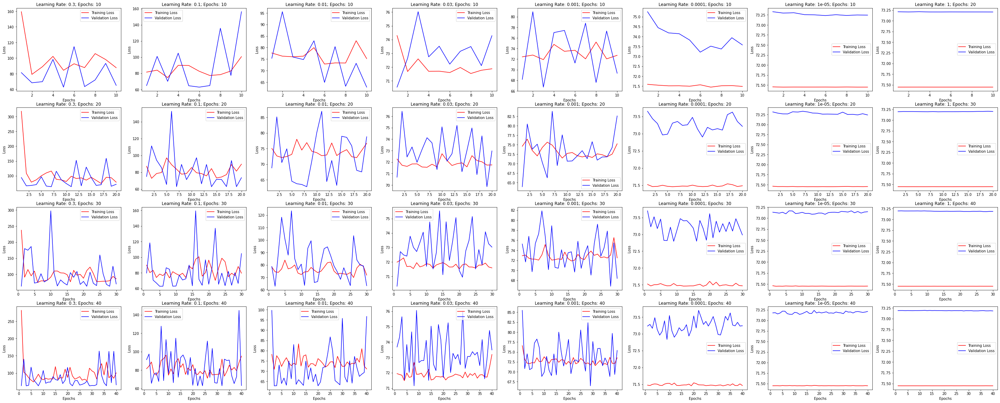

In [24]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==2) & (history[j]['Activation Function']=='sigmoid') & (history[j]['Regularization']=='None') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, there is no significant trend with very less difference between training and validation loss and fluctuations for all values of epochs.
- For Learning Rate=0.1 and 0.01, there is no significant trend and noticable fluctuation for all values of epochs.
- For Learning Rate=0.03, 0.001 and 0.0001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and fluctuation for all values of epochs.
- For Learning Rate=0.00001 and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, fluctuations increase with increase in epochs with constant learning rate.

### Network-8: 

Static Specifications:

- Number of Hidden Layers: 2
- Activation Function: Sigmoid
- Regularization: L1

In [25]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='sigmoid', kernel_regularizer='l1'))
model.add(tf.keras.layers.Dense(64, activation='sigmoid', kernel_regularizer='l1'))
model.add(tf.keras.layers.Dense(1, activation='linear', kernel_regularizer='l1'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 2,
         'Activation Function' : 'sigmoid',
         'Regularization' : 'L1',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 13ms/step - loss: 433.4359 - root_mean_squared_error: 12.9125 - val_loss: 396.3428 - val_root_mean_squared_error: 8.2825
Epoch 2/10
19/19 [==============================] - 0s 4ms/step - loss: 416.0138 - root_mean_squared_error: 11.1938 - val_loss: 325.2522 - val_root_mean_squared_error: 8.5268
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 342.9201 - root_mean_squared_error: 10.5820 - val_loss: 294.9193 - val_root_mean_squared_error: 9.4984
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 270.0426 - root_mean_squared_error: 9.4827 - val_loss: 241.5589 - val_root_mean_squared_error: 9.4430
Epoch 5/10
19/19 [==============================] - 0s 5ms/step - loss: 230.2753 - root_mean_squared_error: 9.9992 - val_loss: 194.9773 - val_root_mean_squared_error: 8.9170
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 217.4128 - root_mean_squared_error: 9.9458 - val_loss:

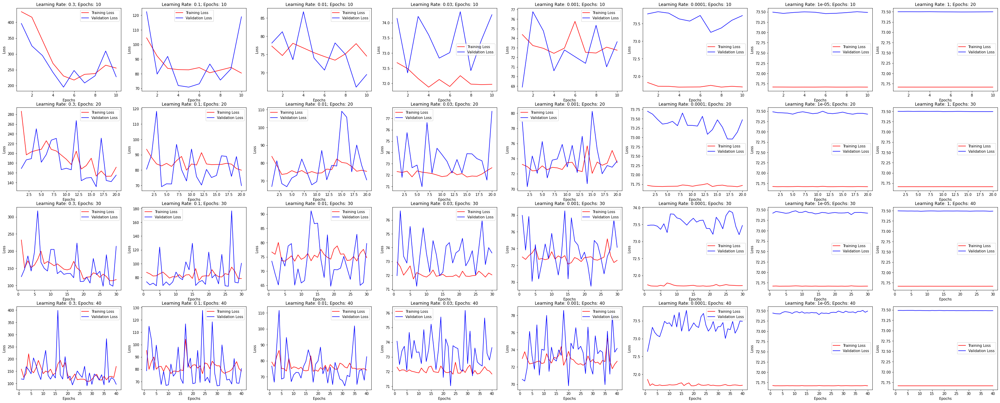

In [26]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==2) & (history[j]['Activation Function']=='sigmoid') & (history[j]['Regularization']=='L1') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, the general trend of the loss is decreasing in nature, with very less difference between training and validation loss if we train for 10 or 20 epochs. However, if we train for 30 or 40 epochs, the loss fluctuates without any significant trend.
- For Learning Rate=0.1 and 0.01, there is a slight decreasing trend and noticable fluctuation for all values of epochs.
- For Learning Rate=0.03, 0.001, and 0.0001 there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.
- For Learning Rate=0.00001 and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, fluctuations increase with increase in epochs with constant learning rate.

### Network-9: 

Static Specifications:

- Number of Hidden Layers: 2
- Activation Function: Sigmoid
- Regularization: L2

In [27]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='sigmoid', kernel_regularizer='l2'))
model.add(tf.keras.layers.Dense(64, activation='sigmoid', kernel_regularizer='l2'))
model.add(tf.keras.layers.Dense(1, activation='linear', kernel_regularizer='l2'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 2,
         'Activation Function' : 'sigmoid',
         'Regularization' : 'L2',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 13ms/step - loss: 553.3162 - root_mean_squared_error: 11.3302 - val_loss: 389.6902 - val_root_mean_squared_error: 11.4792
Epoch 2/10
19/19 [==============================] - 0s 4ms/step - loss: 312.0039 - root_mean_squared_error: 10.7424 - val_loss: 389.8676 - val_root_mean_squared_error: 8.0623
Epoch 3/10
19/19 [==============================] - 0s 5ms/step - loss: 586.2328 - root_mean_squared_error: 10.0730 - val_loss: 582.8162 - val_root_mean_squared_error: 8.1152
Epoch 4/10
19/19 [==============================] - 0s 5ms/step - loss: 520.5231 - root_mean_squared_error: 9.1364 - val_loss: 409.0353 - val_root_mean_squared_error: 7.9470
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 375.4853 - root_mean_squared_error: 9.2085 - val_loss: 318.2363 - val_root_mean_squared_error: 8.0124
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 285.3813 - root_mean_squared_error: 9.1731 - val_loss

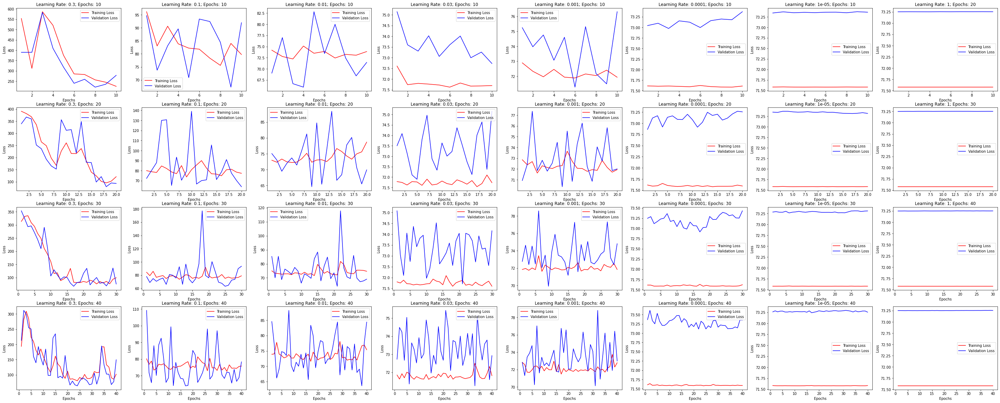

In [28]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==2) & (history[j]['Activation Function']=='sigmoid') & (history[j]['Regularization']=='L2') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, the general trend of the loss is decreasing in nature, with very less difference between training and validation loss for all values of epochs.
- For Learning Rate=0.1 and 0.01, there is no significant trend and noticable fluctuation for all values of epochs.
- For Learning Rate=0.03, 0.001 and 0.0001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.
- For Learning Rate=0.00001 and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, fluctuations increase with increase in epochs with constant learning rate.

As we can see, the loss stabilizes earlier with regularization than without regularization.

### Network-10: 

Static Specifications:

- Number of Hidden Layers: 2
- Activation Function: ReLU
- Regularization: None

In [29]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='relu'))
model.add(tf.keras.layers.Dense(64, activation='relu'))
model.add(tf.keras.layers.Dense(1, activation='linear'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 2,
         'Activation Function' : 'relu',
         'Regularization' : 'None',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }
    
    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 10ms/step - loss: 2091730.7500 - root_mean_squared_error: 1446.2817 - val_loss: 85.2339 - val_root_mean_squared_error: 9.2322
Epoch 2/10
19/19 [==============================] - 0s 5ms/step - loss: 106.8313 - root_mean_squared_error: 10.3359 - val_loss: 62.8695 - val_root_mean_squared_error: 7.9290
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 73.4176 - root_mean_squared_error: 8.5684 - val_loss: 113.6210 - val_root_mean_squared_error: 10.6593
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 79.4764 - root_mean_squared_error: 8.9150 - val_loss: 89.2179 - val_root_mean_squared_error: 9.4455
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 76.0471 - root_mean_squared_error: 8.7205 - val_loss: 71.3398 - val_root_mean_squared_error: 8.4463
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 76.7502 - root_mean_squared_error: 8.7607 - val_loss: 1

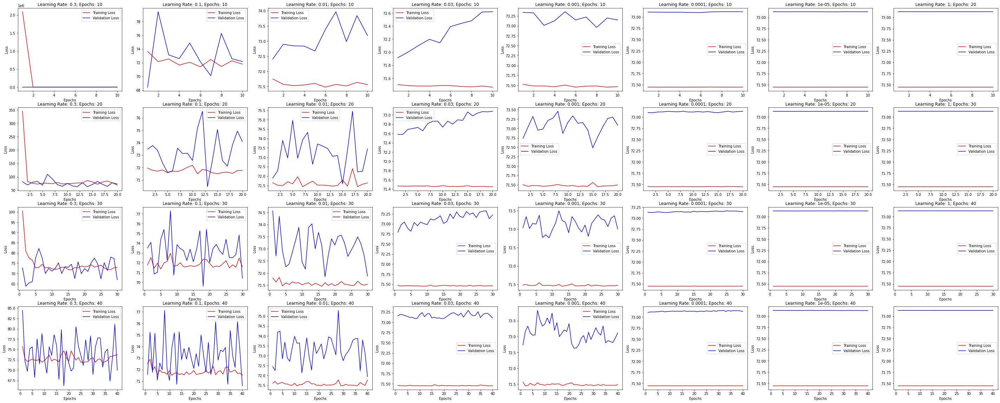

In [30]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==2) & (history[j]['Activation Function']=='relu') & (history[j]['Regularization']=='None') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, there is an intial drop in loss followed by a plateau if we train for 10, 20, or 30 epochs. However, if we train for 40 epochs, there is no significant trend by high fluctuation.
- For Learning Rate=0.1 and 0.01, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is a slight decreasing trend and noticable fluctuation for all values of epochs.
- For Learning Rate=0.03and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, 0.00001 and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, fluctuations increase with increase in epochs keeping learning rate constant.

### Network-11: 

Static Specifications:

- Number of Hidden Layers: 2
- Activation Function: ReLU
- Regularization: L1

In [31]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='relu', kernel_regularizer='l1'))
model.add(tf.keras.layers.Dense(64, activation='relu', kernel_regularizer='l1'))
model.add(tf.keras.layers.Dense(1, activation='linear', kernel_regularizer='l1'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 2,
         'Activation Function' : 'relu',
         'Regularization' : 'L1',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }
    
    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 12ms/step - loss: 4942091.5000 - root_mean_squared_error: 2223.0339 - val_loss: 3479.5000 - val_root_mean_squared_error: 56.1690
Epoch 2/10
19/19 [==============================] - 0s 4ms/step - loss: 2947.0276 - root_mean_squared_error: 51.0404 - val_loss: 785.5827 - val_root_mean_squared_error: 20.9156
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 454.9498 - root_mean_squared_error: 10.5745 - val_loss: 438.4729 - val_root_mean_squared_error: 10.0680
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 443.4742 - root_mean_squared_error: 10.5976 - val_loss: 404.4021 - val_root_mean_squared_error: 8.8859
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 403.3414 - root_mean_squared_error: 9.0389 - val_loss: 406.5514 - val_root_mean_squared_error: 9.4140
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 393.2442 - root_mean_squared_error: 8.8266

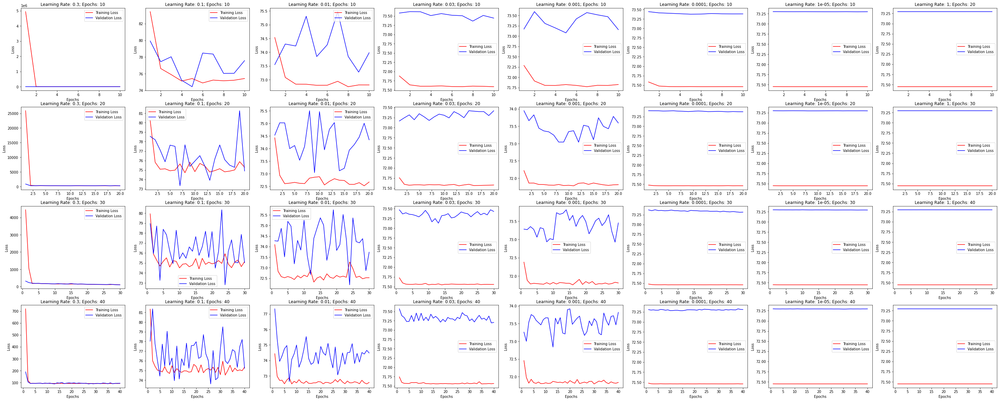

In [32]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==2) & (history[j]['Activation Function']=='relu') & (history[j]['Regularization']=='L1') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, there is an initial drop leading to a plateau in nature, with very less difference between training and validation loss for all value of epochs.
- For Learning Rate=0.1 and 0.01, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is a slight decreasing trend and noticable fluctuation for all values of epochs.
- For Learning Rate=0.03and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, 0.00001 and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

### Network-12: 

Static Specifications:

- Number of Hidden Layers: 2
- Activation Function: ReLU
- Regularization: L2

In [33]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='relu', kernel_regularizer='l2'))
model.add(tf.keras.layers.Dense(64, activation='relu', kernel_regularizer='l2'))
model.add(tf.keras.layers.Dense(1, activation='linear', kernel_regularizer='l2'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 2,
         'Activation Function' : 'relu',
         'Regularization' : 'L2',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 12ms/step - loss: 1310217.7500 - root_mean_squared_error: 1144.4338 - val_loss: 1087.3372 - val_root_mean_squared_error: 15.2781
Epoch 2/10
19/19 [==============================] - 0s 5ms/step - loss: 1109.1871 - root_mean_squared_error: 12.7710 - val_loss: 1096.1606 - val_root_mean_squared_error: 8.6720
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 1138.7976 - root_mean_squared_error: 8.6274 - val_loss: 1169.9456 - val_root_mean_squared_error: 8.7046
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 1173.0833 - root_mean_squared_error: 8.6232 - val_loss: 1164.7822 - val_root_mean_squared_error: 8.1136
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 1176.9861 - root_mean_squared_error: 9.0128 - val_loss: 1154.8916 - val_root_mean_squared_error: 7.9564
Epoch 6/10
19/19 [==============================] - 0s 5ms/step - loss: 1165.7216 - root_mean_squared_error: 8.

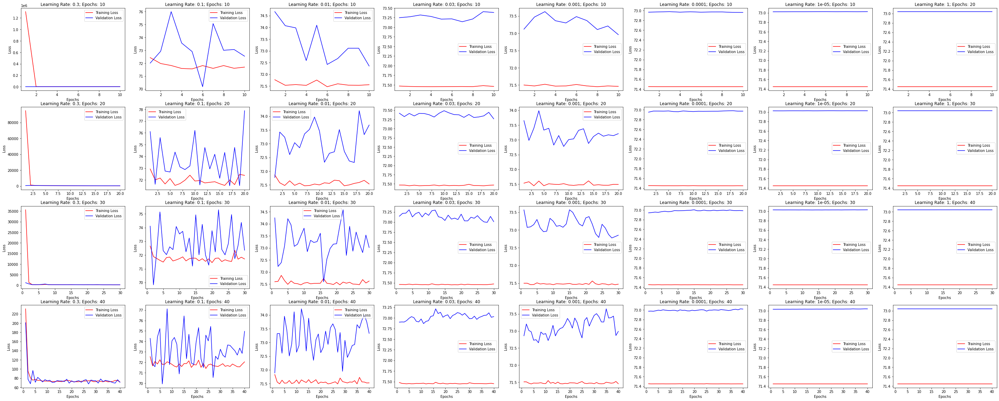

In [34]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==2) & (history[j]['Activation Function']=='relu') & (history[j]['Regularization']=='L2') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, there is an initial drop in loss leading to a plateau in nature, with very less difference between training and validation loss (except in the initial stage) for all value of epochs.
- For Learning Rate=0.1 and 0.01, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and noticable fluctuation for all values of epochs.
- For Learning Rate=0.03 and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, 0.00001 and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, fluctuations increase with increase in epochs keeping learning rate constant.

As we can see, the loss stabilizes earlier with regularization than without regularization. Also, there is more fluctuation in L2 regularization.

### Network-13: 

Static Specifications:

- Number of Hidden Layers: 3
- Activation Function: Sigmoid
- Regularization: None

In [35]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='sigmoid'))
model.add(tf.keras.layers.Dense(64, activation='sigmoid'))
model.add(tf.keras.layers.Dense(32, activation='sigmoid'))
model.add(tf.keras.layers.Dense(1, activation='linear'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 3,
         'Activation Function' : 'sigmoid',
         'Regularization' : 'None',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 12ms/step - loss: 149.1621 - root_mean_squared_error: 12.2132 - val_loss: 63.0280 - val_root_mean_squared_error: 7.9390
Epoch 2/10
19/19 [==============================] - 0s 4ms/step - loss: 72.2928 - root_mean_squared_error: 8.5025 - val_loss: 72.3834 - val_root_mean_squared_error: 8.5078
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 74.4174 - root_mean_squared_error: 8.6266 - val_loss: 82.5855 - val_root_mean_squared_error: 9.0877
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 78.2379 - root_mean_squared_error: 8.8452 - val_loss: 99.2991 - val_root_mean_squared_error: 9.9649
Epoch 5/10
19/19 [==============================] - 0s 5ms/step - loss: 71.7168 - root_mean_squared_error: 8.4686 - val_loss: 88.0695 - val_root_mean_squared_error: 9.3845
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 78.5857 - root_mean_squared_error: 8.8649 - val_loss: 62.8215 - v

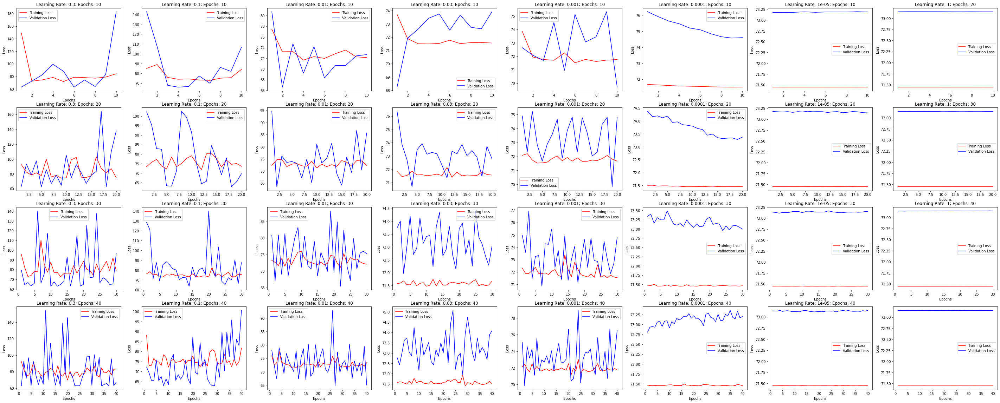

In [36]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==3) & (history[j]['Activation Function']=='sigmoid') & (history[j]['Regularization']=='None') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, there is no significant trend.
- For Learning Rate=0.1 and 0.01, the validation loss fluctuates more vigorously than the training loss for all values of epochs.
- For Learning Rate=0.03 and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, there is an upward trend if we train for 10 or 20 epochs, and no significant trend if we train for 30 or 40 epochs. However, there is a significant difference between the training and validation loss, with validation loss being more than training loss and some fluctuation for all values of epochs. 
- For Learning Rate= 0.00001 and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, the fluctuations increase as we increase number of epochs keeping learning rate constant.

### Network-14: 

Static Specifications:

- Number of Hidden Layers: 3
- Activation Function: Sigmoid
- Regularization: L1

In [37]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='sigmoid', kernel_regularizer='l1'))
model.add(tf.keras.layers.Dense(64, activation='sigmoid', kernel_regularizer='l1'))
model.add(tf.keras.layers.Dense(32, activation='sigmoid', kernel_regularizer='l1'))
model.add(tf.keras.layers.Dense(1, activation='linear', kernel_regularizer='l1'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 3,
         'Activation Function' : 'sigmoid',
         'Regularization' : 'L1',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 13ms/step - loss: 323.5305 - root_mean_squared_error: 10.3388 - val_loss: 284.3401 - val_root_mean_squared_error: 8.8984
Epoch 2/10
19/19 [==============================] - 0s 4ms/step - loss: 224.8696 - root_mean_squared_error: 8.6958 - val_loss: 184.5138 - val_root_mean_squared_error: 9.0148
Epoch 3/10
19/19 [==============================] - 0s 5ms/step - loss: 163.3010 - root_mean_squared_error: 8.8847 - val_loss: 137.6558 - val_root_mean_squared_error: 8.5838
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 132.7903 - root_mean_squared_error: 9.1234 - val_loss: 111.6418 - val_root_mean_squared_error: 8.4173
Epoch 5/10
19/19 [==============================] - 0s 5ms/step - loss: 123.1606 - root_mean_squared_error: 9.3666 - val_loss: 171.7561 - val_root_mean_squared_error: 11.8027
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 109.9701 - root_mean_squared_error: 8.8039 - val_loss: 

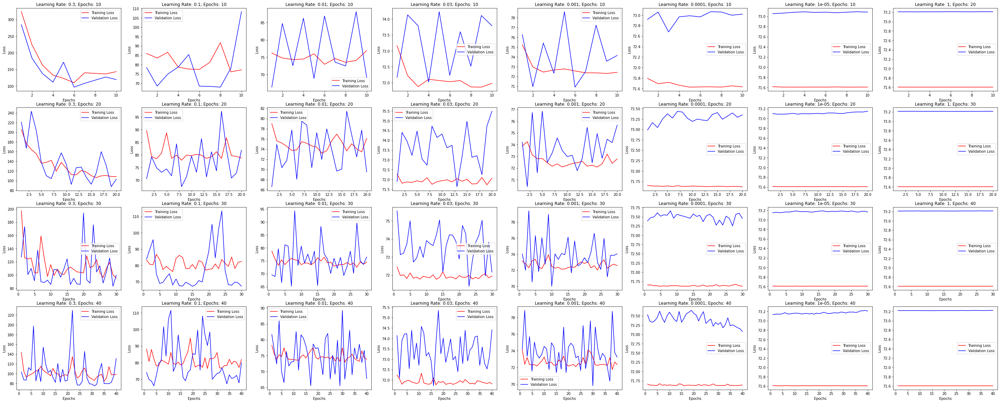

In [38]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==3) & (history[j]['Activation Function']=='sigmoid') & (history[j]['Regularization']=='L1') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, the general trend of the loss is decreasing in nature, with very less difference between training and validation loss if we train for 10 or 20 epochs. However, if we train for 30 or 40 epochs, the loss fluctuates without any significant trend. 
- For Learning Rate=0.1 and 0.01, the validation loss fluctuates more vigorously than the training loss for all values of epochs.
- For Learning Rate=0.03 and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, there is an upward trend if we train for 10 or 20 epochs, and no significant trend if we train for 30 or 40 epochs. However, there is a significant difference between the training and validation loss, with validation loss being more than training loss and some fluctuation for all values of epochs.
- For Learning Rate= 0.00001 and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, the fluctuations increase as we increase the number of epochs keeping learning rate constant.

### Network-15: 

Static Specifications:

- Number of Hidden Layers: 3
- Activation Function: Sigmoid
- Regularization: L2

In [39]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='sigmoid', kernel_regularizer='l2'))
model.add(tf.keras.layers.Dense(64, activation='sigmoid', kernel_regularizer='l2'))
model.add(tf.keras.layers.Dense(32, activation='sigmoid', kernel_regularizer='l2'))
model.add(tf.keras.layers.Dense(1, activation='linear', kernel_regularizer='l2'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 3,
         'Activation Function' : 'sigmoid',
         'Regularization' : 'L2',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 12ms/step - loss: 424.8272 - root_mean_squared_error: 12.4425 - val_loss: 257.0118 - val_root_mean_squared_error: 9.4879
Epoch 2/10
19/19 [==============================] - 0s 4ms/step - loss: 212.0424 - root_mean_squared_error: 9.1512 - val_loss: 199.2849 - val_root_mean_squared_error: 8.2182
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 239.9369 - root_mean_squared_error: 9.6224 - val_loss: 270.3066 - val_root_mean_squared_error: 9.3546
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 274.5564 - root_mean_squared_error: 9.0454 - val_loss: 227.6146 - val_root_mean_squared_error: 7.9751
Epoch 5/10
19/19 [==============================] - 0s 6ms/step - loss: 216.1901 - root_mean_squared_error: 8.9202 - val_loss: 171.5493 - val_root_mean_squared_error: 8.2432
Epoch 6/10
19/19 [==============================] - 0s 4ms/step - loss: 146.8353 - root_mean_squared_error: 8.6806 - val_loss: 1

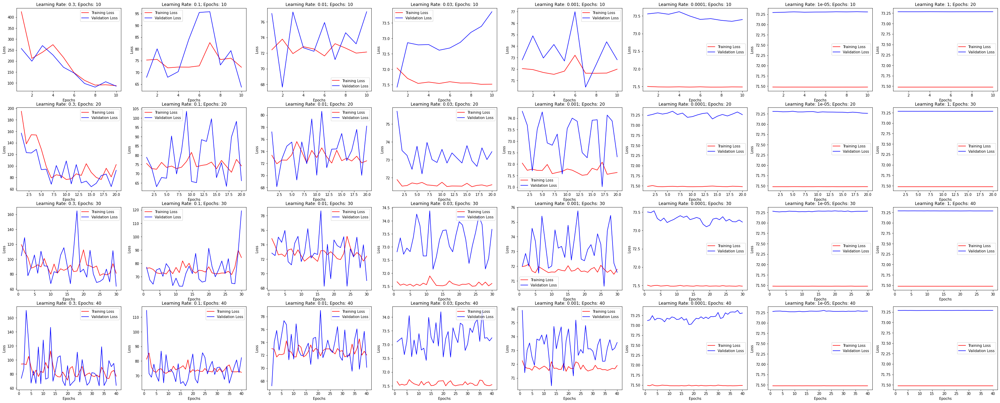

In [40]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==3) & (history[j]['Activation Function']=='sigmoid') & (history[j]['Regularization']=='L2') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, the general trend of the loss is decreasing in nature, with very less difference between training and validation loss if we train for 10 or 20 epochs. However, if we train for 30 or 40 epochs, the loss fluctuates without any significant trend. 
- For Learning Rate=0.1 and 0.01, the validation loss fluctuates more vigorously than the training loss for all values of epochs.
- For Learning Rate=0.03 and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, there is no significant trend. However, there is a significant difference between the training and validation loss, with validation loss being more than training loss and some fluctuation for all values of epochs.
- For Learning Rate=0.00001 and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

 In general, the fluctuations increase with increase in number of epochs keeping learning rate constant.

As we can see, the loss stabilizes earlier with regularization than without regularization. Also, there is more fluctuation in loss with L1 regularization.

### Network-16: 

Static Specifications:

- Number of Hidden Layers: 3
- Activation Function: ReLU
- Regularization: None

In [41]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='relu'))
model.add(tf.keras.layers.Dense(64, activation='relu'))
model.add(tf.keras.layers.Dense(32, activation='relu'))
model.add(tf.keras.layers.Dense(1, activation='linear'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 3,
         'Activation Function' : 'relu',
         'Regularization' : 'None',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 12ms/step - loss: 221558544.0000 - root_mean_squared_error: 14884.8428 - val_loss: 4949.0107 - val_root_mean_squared_error: 70.3492
Epoch 2/10
19/19 [==============================] - 0s 4ms/step - loss: 12617.0869 - root_mean_squared_error: 112.3258 - val_loss: 198.7159 - val_root_mean_squared_error: 14.0967
Epoch 3/10
19/19 [==============================] - 0s 4ms/step - loss: 179.3249 - root_mean_squared_error: 13.3912 - val_loss: 75.9766 - val_root_mean_squared_error: 8.7165
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 88.7142 - root_mean_squared_error: 9.4188 - val_loss: 96.8681 - val_root_mean_squared_error: 9.8422
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 73.6838 - root_mean_squared_error: 8.5839 - val_loss: 78.7374 - val_root_mean_squared_error: 8.8734
Epoch 6/10
19/19 [==============================] - 0s 5ms/step - loss: 75.5009 - root_mean_squared_error: 8.6891 - 

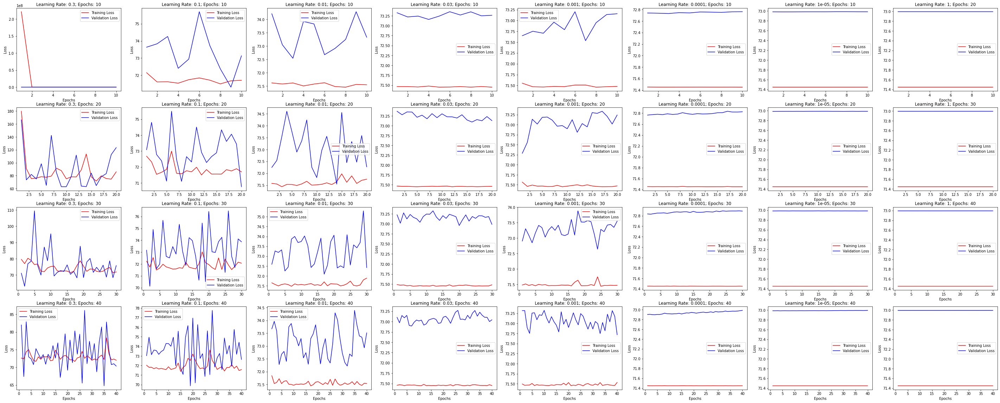

In [42]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==3) & (history[j]['Activation Function']=='relu') & (history[j]['Regularization']=='None') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, there is an initial drop in loss leading to a plateau with very less difference between training and validation loss if we train for 10 or 20 epochs. However, if we train for 30 or 40 epochs, the loss fluctuates without any significant trend. 
- For Learning Rate=0.1 and 0.01, the validation loss fluctuates more vigorously than the training loss for all values of epochs.
- For Learning Rate=0.03 and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is a general upward trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, 0.00001 and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, the fluctuations increase with increase in epochs keeping learning rate constant.

### Network-17: 

Static Specifications:

- Number of Hidden Layers: 3
- Activation Function: ReLU
- Regularization: L1

In [43]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='relu', kernel_regularizer='l1'))
model.add(tf.keras.layers.Dense(64, activation='relu', kernel_regularizer='l1'))
model.add(tf.keras.layers.Dense(32, activation='relu', kernel_regularizer='l1'))
model.add(tf.keras.layers.Dense(1, activation='linear', kernel_regularizer='l1'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 3,
         'Activation Function' : 'relu',
         'Regularization' : 'L1',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 16ms/step - loss: 54007364.0000 - root_mean_squared_error: 7348.9561 - val_loss: 927.8996 - val_root_mean_squared_error: 25.0786
Epoch 2/10
19/19 [==============================] - 0s 7ms/step - loss: 811.2087 - root_mean_squared_error: 22.3597 - val_loss: 952.1318 - val_root_mean_squared_error: 25.2570
Epoch 3/10
19/19 [==============================] - 0s 6ms/step - loss: 316133.0625 - root_mean_squared_error: 561.9838 - val_loss: 964.0115 - val_root_mean_squared_error: 25.7315
Epoch 4/10
19/19 [==============================] - 0s 6ms/step - loss: 823.4542 - root_mean_squared_error: 22.9524 - val_loss: 958.9333 - val_root_mean_squared_error: 25.8213
Epoch 5/10
19/19 [==============================] - 0s 7ms/step - loss: 815.6288 - root_mean_squared_error: 22.9363 - val_loss: 949.4754 - val_root_mean_squared_error: 25.7350
Epoch 6/10
19/19 [==============================] - 0s 6ms/step - loss: 806.7446 - root_mean_squared_error: 

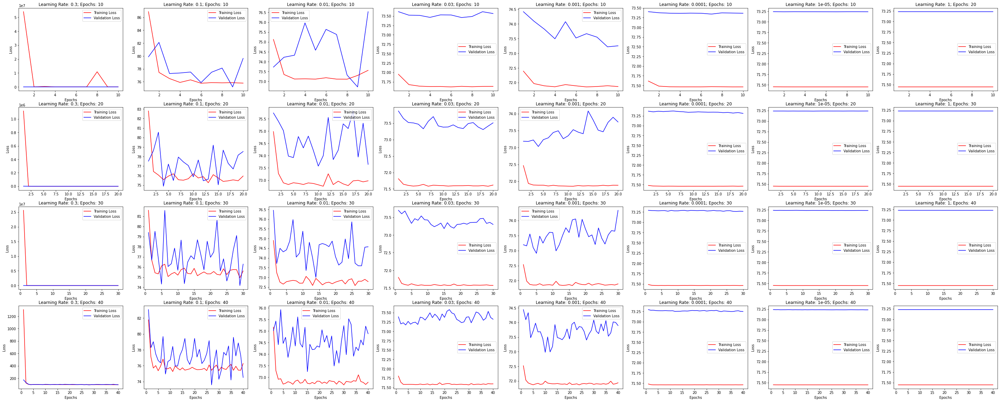

In [44]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==3) & (history[j]['Activation Function']=='relu') & (history[j]['Regularization']=='L1') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validation loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, there is an initial drop in training loss, with no fluctuations for all values of epochs.
- For Learning Rate=0.1 and 0.01, the validation loss fluctuates more vigorously than the training loss for all values of epochs.
- For Learning Rate=0.03 and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is a general upward trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, 0.00001 and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, the fluctuations increase with the number of epochs keeping the learning rate constant.

### Network-18: 

Static Specifications:

- Number of Hidden Layers: 3
- Activation Function: ReLU
- Regularization: L2

In [45]:
# building the basic neural network with the statics specifications
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(128, input_dim=14, activation='relu', kernel_regularizer='l2'))
model.add(tf.keras.layers.Dense(64, activation='relu', kernel_regularizer='l2'))
model.add(tf.keras.layers.Dense(32, activation='relu', kernel_regularizer='l2'))
model.add(tf.keras.layers.Dense(1, activation='linear', kernel_regularizer='l2'))

# iterating over the iterable specifications
for lr in learning_rates:
  for ep in epochs:

    # compiling and fitting the model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])
    hist = model.fit(x_train, y_train, batch_size=10, epochs=ep, validation_split=0.1275)

    # obtaining the predictions on the testing set and calculating the rmse
    pred = model.predict(x_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))

    # storing the model specifications and results in a dictionary
    h = {
        'Number of Layers' : 3,
         'Activation Function' : 'relu',
         'Regularization' : 'L2',
         'Learning Rate' : lr,
         'Epochs' : ep,
         'Test RMSE' : rmse,
         'Train RMSE History' : hist.history['root_mean_squared_error'],
         'Validation RMSE History' : hist.history['val_root_mean_squared_error'],
         'Train Loss History' : hist.history['loss'],
         'Validation Loss History' : hist.history['val_loss']
    }

    # appending the dictionary to history
    history.append(h)

Epoch 1/10
19/19 [==============================] - 1s 13ms/step - loss: 430823840.0000 - root_mean_squared_error: 20756.2793 - val_loss: 1841.9086 - val_root_mean_squared_error: 25.1414
Epoch 2/10
19/19 [==============================] - 0s 4ms/step - loss: 4745.6113 - root_mean_squared_error: 57.5154 - val_loss: 2238.1130 - val_root_mean_squared_error: 25.3305
Epoch 3/10
19/19 [==============================] - 0s 5ms/step - loss: 2148.0774 - root_mean_squared_error: 22.4972 - val_loss: 2313.3757 - val_root_mean_squared_error: 25.3327
Epoch 4/10
19/19 [==============================] - 0s 4ms/step - loss: 2184.3579 - root_mean_squared_error: 22.4801 - val_loss: 2323.6921 - val_root_mean_squared_error: 25.3011
Epoch 5/10
19/19 [==============================] - 0s 4ms/step - loss: 2188.2017 - root_mean_squared_error: 22.4444 - val_loss: 2322.9397 - val_root_mean_squared_error: 25.2602
Epoch 6/10
19/19 [==============================] - 0s 5ms/step - loss: 2186.5874 - root_mean_squared

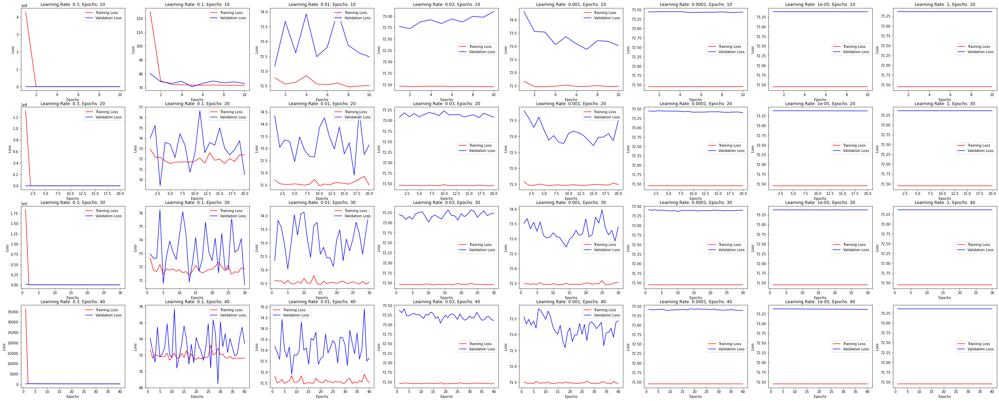

In [46]:
# initial setup for the figure
i=1
plt.figure(figsize=(50, 20))

# iterating over the iterable specifications
for ep in epochs:
  for lr in learning_rates:
    for j in range(len(history)):
      plt.title(str.format('Learning Rate: {}; Epochs: {}', lr, ep))

      # extracting the train and validation loss for every combination of the iterable specifications with the given static specifications
      if ((history[j]['Number of Layers']==3) & (history[j]['Activation Function']=='relu') & (history[j]['Regularization']=='L2') & (history[j]['Epochs']==ep) & (history[j]['Learning Rate']==lr)):
        tl = history[j]['Train Loss History']
        vl = history[j]['Validation Loss History']
        eps = range(1, ep+1)

        # plotting the train and validatin loss history
        plt.subplot(4, 8, i)
        plt.plot(eps, tl, 'r', label='Training Loss')
        plt.plot(eps, vl, 'b', label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        i=i+1

As we can see:
- For Learning Rate=0.3, there is an initial drop in training loss and no fluctuations for all values of epochs.
- For Learning Rate=0.1 and 0.01, the validation loss fluctuates more vigorously than the training loss for all values of epochs.
- For Learning Rate=0.03 and 0.001, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is a general upward trend and some fluctuation for all values of epochs.
- For Learning Rate=0.0001, 0.00001 and 1, there is a significant difference between the training and validation loss, with validation loss being more than training loss. There is no significant trend and negligible fluctuation for all values of epochs.

In general, the fluctuations increase with increase in number of epochs keeping the learning rate constant.

As we can see, the loss stabilizes earlier with regularization than without regularization. There is more fluctuation with L2 regularization.

## Tabulating the Results

To tabulate the results, we convert the list of dictionaries history into a dataframe using the from_dict() function from the Pandas library.

In [47]:
# converting the history of the models into a dataframe
tabulation = pd.DataFrame.from_dict(history)
tabulation

,Number of Layers,Activation Function,Regularization,Learning Rate,Epochs,Test RMSE,Train RMSE History,Validation RMSE History,Train Loss History,Validation Loss History
0,1,sigmoid,None,1.00000,10,5.529437,"[25.750240325927734, 11.2677583694458, 8.95323...","[7.94711446762085, 11.259202003479004, 7.53521...","[663.0748901367188, 126.96238708496094, 80.160...","[63.1566276550293, 126.7696304321289, 56.77944..."
1,1,sigmoid,None,1.00000,20,4.087810,"[23.243133544921875, 8.240589141845703, 6.3584...","[7.63330078125, 7.417976379394531, 4.594689846...","[540.2432250976562, 67.90731048583984, 40.4298...","[58.26728057861328, 55.02637481689453, 21.1111..."
2,1,sigmoid,None,1.00000,30,3.494878,"[16.11099624633789, 7.007575988769531, 4.25619...","[4.6613545417785645, 4.484107494354248, 4.9078...","[259.5642395019531, 49.10612487792969, 18.1151...","[21.728227615356445, 20.107219696044922, 24.08..."
3,1,sigmoid,None,1.00000,40,5.855381,"[13.653800964355469, 7.833705425262451, 6.1087...","[5.99489688873291, 4.315436363220215, 7.385462...","[186.42630004882812, 61.366939544677734, 37.31...","[35.93878936767578, 18.622989654541016, 54.545..."
4,1,sigmoid,None,0.30000,10,4.462170,"[5.387218475341797, 4.853173732757568, 4.34721...","[4.9409308433532715, 4.061155796051025, 4.2687...","[29.022125244140625, 23.55329704284668, 18.898...","[24.412796020507812, 16.49298667907715, 18.222..."
...,...,...,...,...,...,...,...,...,...,...
571,3,relu,L2,0.00010,40,7.805472,"[8.452699661254883, 8.4526948928833, 8.4527091...","[8.565890312194824, 8.565841674804688, 8.56592...","[71.44813537597656, 71.44805908203125, 71.4482...","[73.37447357177734, 73.37364196777344, 73.3750..."
572,3,relu,L2,0.00001,10,7.805474,"[8.45268440246582, 8.45268440246582, 8.4526844...","[8.5651216506958, 8.565123558044434, 8.5651292...","[71.44788360595703, 71.44788360595703, 71.4478...","[73.36131286621094, 73.3613510131836, 73.36145..."
573,3,relu,L2,0.00001,20,7.805473,"[8.45268440246582, 8.45268440246582, 8.4526853...","[8.565116882324219, 8.565117835998535, 8.56510...","[71.44788360595703, 71.44786834716797, 71.4478...","[73.3612289428711, 73.36125183105469, 73.36108..."
574,3,relu,L2,0.00001,30,7.805465,"[8.45268440246582, 8.45268440246582, 8.4526853...","[8.565119743347168, 8.565118789672852, 8.56511...","[71.44788360595703, 71.44788360595703, 71.4478...","[73.36127471923828, 73.36126708984375, 73.3611..."


To find the best model, we evaluate all the models' performance on the test set using Root Mean Square Error as the metric. Thus, we find the network having the minimum rmse on the test set using the min() function from the Pandas library and filter out it's specifications from the dataframe.

In [48]:
# filtering out the specifications of the best network
tabulation[tabulation['Test RMSE']==tabulation['Test RMSE'].min()]

,Number of Layers,Activation Function,Regularization,Learning Rate,Epochs,Test RMSE,Train RMSE History,Validation RMSE History,Train Loss History,Validation Loss History
155,1,relu,L1,0.0001,40,0.183754,"[0.6446900963783264, 0.6445320844650269, 0.644...","[3.26773738861084, 3.2677676677703857, 3.26773...","[0.6384564638137817, 0.6380018591880798, 0.638...","[10.900848388671875, 10.90092945098877, 10.900..."


As we can see, the network with the lowest rmse has the following specifications:
- Number of Layers: 1 (since the size of the dataset is small, a deeper network may overfit leading to a lower rmse on the test set).
- Activation Funciton: ReLU (relu is better than sigmoid in the case of linear regression).
- Regularization: L1 (Lasso Regression).
- Learning Rate: 0.0001
- Epochs: 40

Since we train for a longer time (high number of epochs), a smaller learning rate controls overfitting.

It has an rmse of 0.183754 on the test set, which indicates that the neural network performs very well.